# Camouflaged Object Detection: Specialized SAM

## Project Goal
Detect camouflaged animals (lizards, moths, insects) that blend into their natural backgrounds.
Base SAM often fails because these objects have **no clear edges**—they're designed by evolution to be invisible.

We will train a **Specialized SAM Decoder** to recognize subtle texture disruptions and 3D shape cues that distinguish animal from background.

## Dataset: COD10K (Camouflaged Object Detection)
- **Train:** ~3,000 images with pixel-level masks.
- **Test:** ~2,000 images.
- **Content:** Animals (lizards, moths, insects, fish) blending into natural scenes.


In [ ]:
import kagglehub
path = kagglehub.dataset_download("aarekaz/cod10k")

100%|██████████| 2.26G/2.26G [00:12<00:00, 196MB/s]

Extracting files...


In [ ]:
# ==== STEP 1: INSTALL DEPENDENCIES ====
try:
    import segment_anything
    print("Segment Anything (Official) already installed.")
except ImportError:
    print("Installing Segment Anything (Official)...")
    %pip install git+https://github.com/facebookresearch/segment-anything.git
    %pip install timm opencv-python huggingface_hub

import os
import cv2
import random
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

# CHANGED: Import from official library
from segment_anything import sam_model_registry, SamPredictor

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {DEVICE}")

# Fix Seeds for Reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

Installing Segment Anything (Official)...
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-3ffgixtu
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-3ffgixtu
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=a292ecc87919124fcc6af16e27003695faee6d2474d4baac1c7f9d27a3c6dc82
  Stored in directory: /tmp/pip-ephem-wheel-cache-vb_emzdk/wheels/29/82/ff/04e2be9805a1cb48bec0b85b5a6da6b63f647645750a0e42d4
Successfully built segment_anything
Using device: cuda


In [ ]:
# ==== STEP 2: DOWNLOAD COD10K DATASET ====
# We use the path from the previous cell (kagglehub download)

print(f"Dataset path from Step 1: {path}")
# The dataset is nested inside 'COD10K-v3'
DATA_ROOT = Path(path) / 'COD10K-v3'

TRAIN_IMG_DIR = DATA_ROOT / 'Train' / 'Image'
# Updated to GT_Object based on directory structure
TRAIN_MASK_DIR = DATA_ROOT / 'Train' / 'GT_Object'
TEST_IMG_DIR = DATA_ROOT / 'Test' / 'Image'
TEST_MASK_DIR = DATA_ROOT / 'Test' / 'GT_Object'

# Check if paths exist
if not TRAIN_IMG_DIR.exists() or not TRAIN_MASK_DIR.exists():
    print(f"⚠️  Dataset structure mismatch at {DATA_ROOT}")
    print("Listing directory contents:")
    if DATA_ROOT.exists():
        for p in DATA_ROOT.glob('*'):
            print(f"  - {p.name}")
else:
    print(f"✅ Dataset directories found at {DATA_ROOT}")
    print(f"Train Images: {TRAIN_IMG_DIR}")
    print(f"Train Masks:  {TRAIN_MASK_DIR}")

# CHANGED: Download SAM ViT-H (Huge) weights
WEIGHTS_DIR = Path('weights')
WEIGHTS_DIR.mkdir(exist_ok=True)
# Explicitly name it vit_h so we know what we are dealing with
CHECKPOINT_PATH = WEIGHTS_DIR / "sam_vit_h_4b8939.pth"

if not CHECKPOINT_PATH.exists():
    print("Downloading SAM ViT-H weights (2.4GB)...")
    !wget -P weights https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

print(f"Weights: {CHECKPOINT_PATH}")

Dataset path from Step 1: /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1
✅ Dataset directories found at /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3
Train Images: /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Train/Image
Train Masks:  /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Train/GT_Object
--2025-11-30 05:22:21--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.249.39.89, 13.249.39.82, 13.249.39.25, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.249.39.89|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘weights/sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   160MB/s    in 16s     

2025-11-30 05:22:37 (155 MB/s) - ‘weights/sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]

Weights: weights

In [ ]:
# ==== OPTIONAL: LOAD PRE-TRAINED MODEL & DATA FROM HUGGING FACE ====
# RUN THIS CELL ONLY IF you want to SKIP training and use your saved model.
# If you want to train from scratch, SKIP THIS CELL.

from huggingface_hub import hf_hub_download
import zipfile
import os

REPO_ID = "AAREKAZ/SpecialSAM"
print(f"Checking for pre-trained assets from {REPO_ID}...")

files_to_download = [
    "camo_decoder_vith.pth",       # The trained model weights
    "camo_train_meta_vith.csv",    # Metadata for training (optional)
    "camo_embeddings_vith.zip"     # Pre-computed embeddings (saves ~2 hours)
]

for fname in files_to_download:
    if not os.path.exists(fname):
        try:
            print(f"Downloading {fname}...")
            hf_hub_download(repo_id=REPO_ID, filename=fname, repo_type="model", local_dir=".")
        except Exception as e:
            print(f"⚠️ Could not download {fname}: {e}")
    else:
        print(f"Found {fname} locally.")

# Unzip embeddings if downloaded
if os.path.exists("camo_embeddings_vith.zip") and not os.path.exists("camo_embeddings_vith"):
    print("Unzipping embeddings... (This allows skipping Step 4)")
    with zipfile.ZipFile("camo_embeddings_vith.zip", 'r') as z:
        z.extractall(".")

if os.path.exists("camo_decoder_vith.pth"):
    print("\n✅ SUCCESS: Pre-trained model loaded!\n")
    print("Recommended Next Steps:")
    print("1. Run STEP 2 and STEP 3 (to verify dataset paths).")
    print("2. SKIP Step 4 and Step 5.")
    print("3. JUMP to Step 6 (Visual Comparison) or Step 7 (Evaluation).")

Checking for pre-trained assets from AAREKAZ/SpecialSAM...


camo_decoder_vith.pth:   0%|          | 0.00/16.3M [00:00<?, ?B/s]

camo_train_meta_vith.csv: 0.00B [00:00, ?B/s]

camo_embeddings_vith.zip:   0%|          | 0.00/23.1G [00:00<?, ?B/s]

Unzipping embeddings... (This allows skipping Step 4)

✅ SUCCESS: Pre-trained model loaded!

Recommended Next Steps:
1. Run STEP 2 and STEP 3 (to verify dataset paths).
2. SKIP Step 4 and Step 5.
3. JUMP to Step 6 (Visual Comparison) or Step 7 (Evaluation).


Processing Training Set...
Found 6000 images in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Train/Image
Found 6000 masks in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Train/GT_Object
Matched 6000 image-mask pairs.
Showing sample: COD10K-CAM-1-Aquatic-1-BatFish-1.jpg


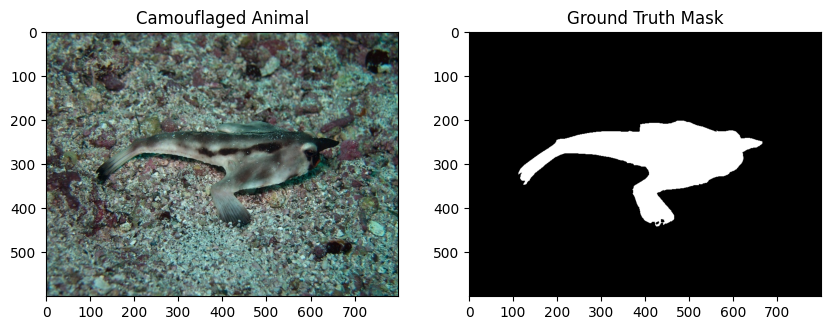

In [ ]:
# ==== STEP 3: DATA LOADING & PREPARATION ====

def get_image_mask_pairs(img_dir, mask_dir, max_samples=None):
    """
    Returns list of (image_path, mask_path) tuples.
    Assumes filenames match (ignoring extension).
    """
    # Get all image files
    img_files = sorted(list(img_dir.rglob('*.jpg')) + list(img_dir.rglob('*.png')))
    print(f"Found {len(img_files)} images in {img_dir}")

    # Get all mask files (store as dict for fast lookup: stem -> path)
    mask_files = sorted(list(mask_dir.rglob('*.png')) + list(mask_dir.rglob('*.jpg')))
    mask_map = {p.stem: p for p in mask_files}
    print(f"Found {len(mask_files)} masks in {mask_dir}")

    pairs = []
    for img_path in img_files:
        # Match by filename stem (e.g. 'image_01' matches 'image_01.png')
        if img_path.stem in mask_map:
            pairs.append((str(img_path), str(mask_map[img_path.stem])))

    print(f"Matched {len(pairs)} image-mask pairs.")

    if max_samples:
        pairs = pairs[:max_samples]

    return pairs

# Get Training Pairs (FULL DATASET)
print("Processing Training Set...")
# CHANGED: Removed max_samples=500 to use ALL data
train_pairs = get_image_mask_pairs(TRAIN_IMG_DIR, TRAIN_MASK_DIR)

# Visualize one sample
if len(train_pairs) > 0:
    img_path, mask_path = train_pairs[0]
    print(f"Showing sample: {Path(img_path).name}")
    img = cv2.imread(img_path); img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1); plt.imshow(img); plt.title("Camouflaged Animal")
    plt.subplot(1, 2, 2); plt.imshow(mask, cmap='gray'); plt.title("Ground Truth Mask")
    plt.show()

In [ ]:
# ==== STEP 4: PRE-COMPUTE EMBEDDINGS (WITH AUGMENTATION) ====
# We'll resize images to 1024x1024 and pre-compute embeddings.
# UPGRADE: We now generate a FLIPPED version of each image to double the dataset size.

TARGET_SIZE = 1024
EMBED_DIR = Path('camo_embeddings_vith')
EMBED_DIR.mkdir(exist_ok=True)

# Load Model
print("Loading SAM ViT-H model...")
model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)
model.to(DEVICE)
predictor = SamPredictor(model)

metadata = []
print(f"Pre-computing embeddings for {len(train_pairs)} samples (x2 with Augmentation)...")

for i, (img_path, mask_path) in enumerate(train_pairs):
    # Load & Resize Original
    img = cv2.imread(img_path)
    if img is None: continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img, (TARGET_SIZE, TARGET_SIZE))

    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask_resized = cv2.resize(mask, (TARGET_SIZE, TARGET_SIZE), interpolation=cv2.INTER_NEAREST)

    # Create Flipped Version
    img_flipped = cv2.flip(img_resized, 1)
    mask_flipped = cv2.flip(mask_resized, 1)

    # Process both Original (0) and Flipped (1)
    for aug_idx, (curr_img, curr_mask) in enumerate([(img_resized, mask_resized), (img_flipped, mask_flipped)]):

        # Define Paths
        aug_suffix = "_flip" if aug_idx == 1 else ""
        embed_path = EMBED_DIR / f"train_{i:04d}{aug_suffix}_embed.npy"
        mask_path_save = EMBED_DIR / f"train_{i:04d}{aug_suffix}_mask.npy"

        if not (embed_path.exists() and mask_path_save.exists()):
            # Encode Image
            predictor.set_image(curr_img)
            embedding = predictor.get_image_embedding().cpu().numpy()
            # Save
            np.save(embed_path, embedding)
            np.save(mask_path_save, curr_mask)
        else:
             # If exists, load mask just for metadata calc
             curr_mask = np.load(mask_path_save)

        # Calculate Metadata (Prompt)
        ys, xs = np.where(curr_mask > 128)
        if len(xs) == 0:
             # Skip empty masks
             continue

        # 1. Point Prompt (Random Foreground Point)
        idx_pt = random.randint(0, len(xs) - 1)
        prompt_x, prompt_y = xs[idx_pt], ys[idx_pt]

        # 2. Box Prompt (Bounding Box)
        x_min, x_max = np.min(xs), np.max(xs)
        y_min, y_max = np.min(ys), np.max(ys)

        metadata.append({
            'embed_path': str(embed_path),
            'mask_path': str(mask_path_save),
            'prompt_x': prompt_x,
            'prompt_y': prompt_y,
            'box_xmin': x_min,
            'box_ymin': y_min,
            'box_xmax': x_max,
            'box_ymax': y_max
        })

    if (i+1) % 50 == 0: print(f"Processed {i+1}/{len(train_pairs)} images")

train_df = pd.DataFrame(metadata)
train_df.to_csv('camo_train_meta_vith.csv', index=False)
print(f"Saved metadata for {len(train_df)} augmented samples.")

Loading SAM ViT-H model...
Pre-computing embeddings for 6000 samples (x2 with Augmentation)...
Processed 50/6000 images
Processed 100/6000 images
Processed 150/6000 images
Processed 200/6000 images
Processed 250/6000 images
Processed 300/6000 images
Processed 350/6000 images
Processed 400/6000 images
Processed 450/6000 images
Processed 500/6000 images
Processed 550/6000 images
Processed 600/6000 images
Processed 650/6000 images
Processed 700/6000 images
Processed 750/6000 images
Processed 800/6000 images
Processed 850/6000 images
Processed 900/6000 images
Processed 950/6000 images
Processed 1000/6000 images
Processed 1050/6000 images
Processed 1100/6000 images
Processed 1150/6000 images
Processed 1200/6000 images
Processed 1250/6000 images
Processed 1300/6000 images
Processed 1350/6000 images
Processed 1400/6000 images
Processed 1450/6000 images
Processed 1500/6000 images
Processed 1550/6000 images
Processed 1600/6000 images
Processed 1650/6000 images
Processed 1700/6000 images
Process

In [ ]:
# ==== STEP 5: TRAINING LOOP (MULTI-PROMPT) ====

class CamoDataset(Dataset):
    def __init__(self, df):
        self.df = df

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        # Load Embedding & Mask
        emb = torch.from_numpy(np.load(row['embed_path'])).to(DEVICE)
        mask = np.load(row['mask_path'])
        mask = (mask > 128).astype(np.float32)
        mask = torch.from_numpy(mask).to(DEVICE)

        # Point Prompt
        point = torch.tensor([[row['prompt_x'], row['prompt_y']]], dtype=torch.float32).to(DEVICE)
        label = torch.tensor([1], dtype=torch.int64).to(DEVICE)

        # Box Prompt [x1, y1, x2, y2]
        box = torch.tensor([[row['box_xmin'], row['box_ymin'], row['box_xmax'], row['box_ymax']]], dtype=torch.float32).to(DEVICE)

        return emb, mask.unsqueeze(0), point, label, box

train_ds = CamoDataset(train_df)
train_loader = DataLoader(train_ds, batch_size=1, shuffle=True)

# Setup Model
if 'model' not in globals():
    model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)
    model.to(DEVICE)

model.train()
for p in model.image_encoder.parameters(): p.requires_grad = False
for p in model.prompt_encoder.parameters(): p.requires_grad = False

optimizer = torch.optim.AdamW(model.mask_decoder.parameters(), lr=1e-4)

EPOCHS = 7
print(f"Starting training for {EPOCHS} epochs (Augmented Data + Random Prompts)...")

for epoch in range(EPOCHS):
    total_loss = 0
    for emb, gt_mask, point, label, box in train_loader:
        emb = emb.squeeze(1)

        # UPGRADE: Randomly switch between Point and Box prompts
        # This teaches the model to handle both types of input
        use_box = random.random() > 0.5

        with torch.no_grad():
            if use_box:
                # Use Box Prompt
                sparse, dense = model.prompt_encoder(
                    points=None,
                    boxes=box,
                    masks=None
                )
            else:
                # Use Point Prompt
                sparse, dense = model.prompt_encoder(
                    points=(point, label),
                    boxes=None,
                    masks=None
                )

        low_res_masks, _ = model.mask_decoder(
            image_embeddings=emb,
            image_pe=model.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse,
            dense_prompt_embeddings=dense,
            multimask_output=False
        )

        pred_mask = F.interpolate(low_res_masks, size=(gt_mask.shape[2], gt_mask.shape[3]),
                                  mode='bilinear', align_corners=False)

        # Combined Loss
        bce_loss = F.binary_cross_entropy_with_logits(pred_mask, gt_mask)
        pred = torch.sigmoid(pred_mask)
        intersection = (pred * gt_mask).sum()
        dice_loss = 1 - (2. * intersection + 1.) / (pred.sum() + gt_mask.sum() + 1.)
        loss = 0.5 * bce_loss + 0.5 * dice_loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{EPOCHS} | Loss: {avg_loss:.4f}")

torch.save(model.mask_decoder.state_dict(), "camo_decoder_vith.pth")
print("Training Complete. Saved.")

Starting training for 7 epochs (Augmented Data + Random Prompts)...
Epoch 1/7 | Loss: 0.1420
Epoch 2/7 | Loss: 0.1272
Epoch 3/7 | Loss: 0.1172
Epoch 4/7 | Loss: 0.1140
Epoch 5/7 | Loss: 0.1113
Epoch 6/7 | Loss: 0.1081
Epoch 7/7 | Loss: 0.1059
Training Complete. Saved.


Found 4000 images in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/Image
Found 4000 masks in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/GT_Object
Matched 4000 image-mask pairs.
Loading models for comparison...
Found 78 unique animals/instances in test set.
Visualizing 10 distinct animals... (Red Star = Prompt Point)


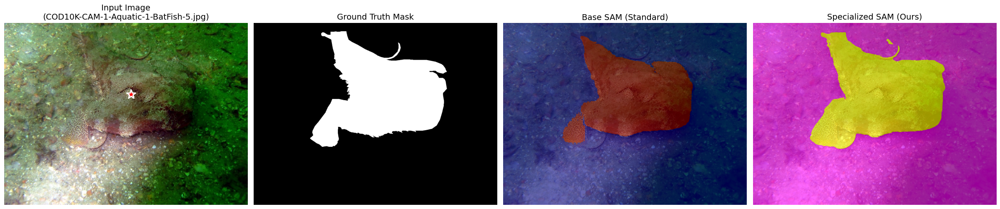

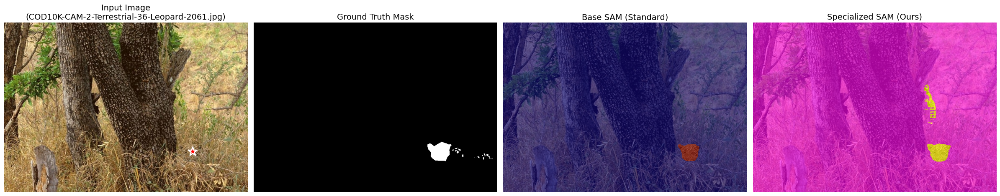

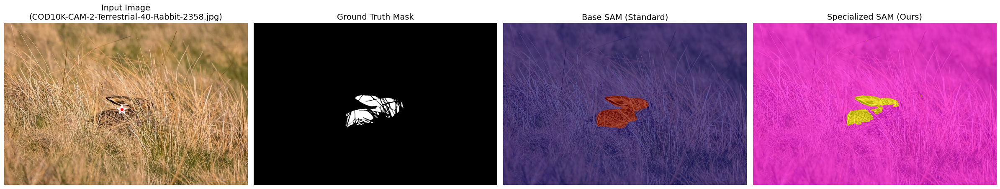

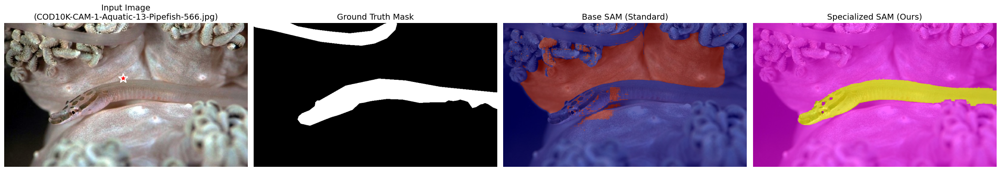

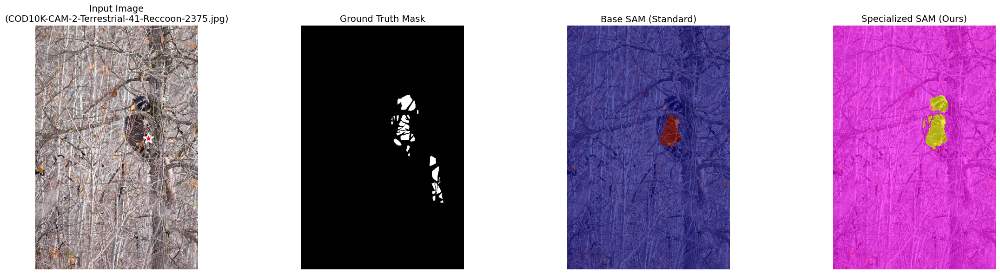

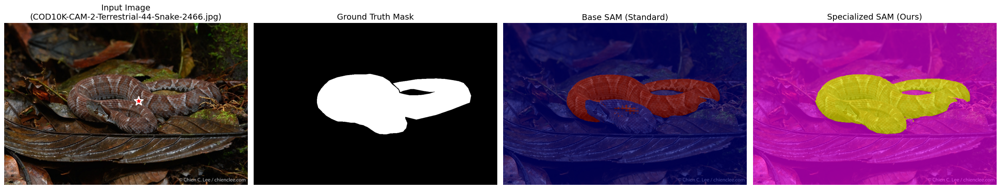

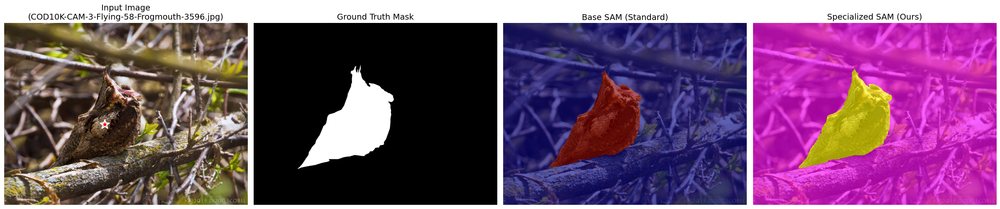

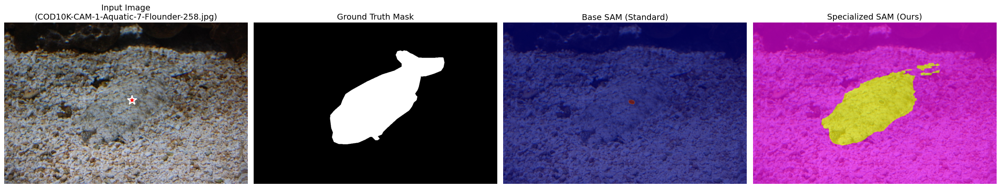

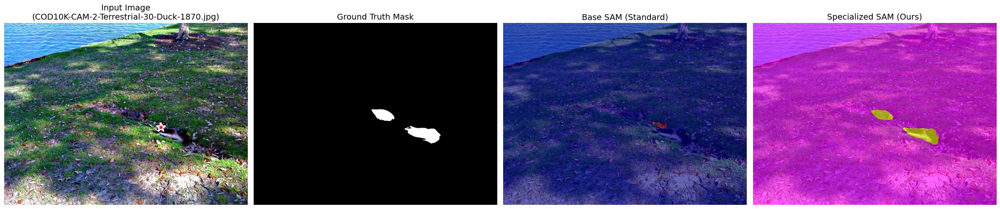

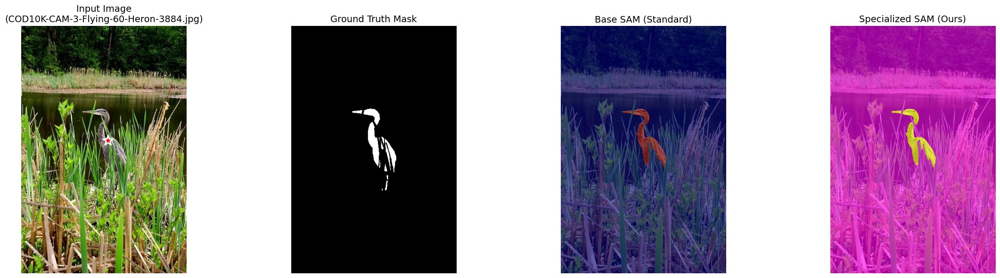

In [ ]:
# ==== STEP 6: SIDE-BY-SIDE VISUAL COMPARISON ====

# 1. Get ALL test pairs first
all_test_pairs = get_image_mask_pairs(TEST_IMG_DIR, TEST_MASK_DIR)

def compare_side_by_side(all_pairs, num_samples=10):
    print("Loading models for comparison...")

    # Load Base Model
    base_model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH).to(DEVICE)
    base_model.eval()
    base_predictor = SamPredictor(base_model)

    # Load Specialized Model (Base weights + Fine-tuned Decoder)
    spec_model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)
    spec_model.mask_decoder.load_state_dict(torch.load("camo_decoder_vith.pth"))
    spec_model.to(DEVICE)
    spec_model.eval()
    spec_predictor = SamPredictor(spec_model)

    # --- IMPROVED SELECTION LOGIC ---
    # Group by "Instance" to avoid showing multiple frames of the same animal
    # Filename format: COD10K-CAM-1-Aquatic-1-BatFish-1.jpg
    # Instance ID:     COD10K-CAM-1-Aquatic-1-BatFish

    # Reset random seed for visualization so we get fresh samples on every run
    random.seed(None)

    instances = {}
    for img_path, mask_path in all_pairs:
        stem = Path(img_path).stem
        # Split by '-' and remove the last part (frame number) to get instance ID
        instance_id = "-".join(stem.split("-")[:-1])
        if instance_id not in instances:
            instances[instance_id] = []
        instances[instance_id].append((img_path, mask_path))

    unique_instances = list(instances.keys())
    print(f"Found {len(unique_instances)} unique animals/instances in test set.")

    # Shuffle all instances to search randomly
    random.shuffle(unique_instances)

    print(f"Visualizing {num_samples} distinct animals... (Red Star = Prompt Point)")

    count = 0
    # Iterate through ALL unique instances until we find 'num_samples' valid ones
    for inst_id in unique_instances:
        if count >= num_samples:
            break

        # Pick one random image from this instance
        img_path, mask_path = random.choice(instances[inst_id])

        # Load Images
        try:
            img = cv2.imread(img_path)
            if img is None: continue
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            if mask is None: continue
        except Exception:
            continue

        # Preprocessing
        h, w = img.shape[:2]
        target_size = 1024
        img_resized = cv2.resize(img, (target_size, target_size))

        # Generate Prompt (Center of Object)
        mask_resized = cv2.resize(mask, (target_size, target_size), interpolation=cv2.INTER_NEAREST)
        ys, xs = np.where(mask_resized > 128)
        if len(xs) == 0:
            # Skip without printing to keep output clean
            continue
        cx, cy = int(np.mean(xs)), int(np.mean(ys))

        # --- Run Base Model ---
        base_predictor.set_image(img_resized)
        base_masks, _, _ = base_predictor.predict(
            point_coords=np.array([[cx, cy]]), point_labels=np.array([1]), multimask_output=False
        )
        base_pred = cv2.resize(base_masks[0].astype(np.uint8), (w, h), interpolation=cv2.INTER_NEAREST)

        # --- Run Specialized Model ---
        spec_predictor.set_image(img_resized)
        spec_masks, _, _ = spec_predictor.predict(
            point_coords=np.array([[cx, cy]]), point_labels=np.array([1]), multimask_output=False
        )
        spec_pred = cv2.resize(spec_masks[0].astype(np.uint8), (w, h), interpolation=cv2.INTER_NEAREST)

        # --- Visualization ---
        fig, axes = plt.subplots(1, 4, figsize=(24, 6))

        # 1. Input + Prompt
        axes[0].imshow(img)
        axes[0].scatter(cx * w // target_size, cy * h // target_size, c='red', marker='*', s=250, edgecolors='white', linewidths=2, label='Prompt')
        axes[0].set_title(f"Input Image\n({Path(img_path).name})", fontsize=14)
        axes[0].axis('off')

        # 2. Ground Truth
        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title("Ground Truth Mask", fontsize=14)
        axes[1].axis('off')

        # 3. Base SAM Prediction
        axes[2].imshow(img)
        axes[2].imshow(base_pred, alpha=0.6, cmap='jet')
        axes[2].set_title("Base SAM (Standard)", fontsize=14)
        axes[2].axis('off')

        # 4. Specialized SAM Prediction
        axes[3].imshow(img)
        axes[3].imshow(spec_pred, alpha=0.6, cmap='spring')
        axes[3].set_title("Specialized SAM (Ours)", fontsize=14)
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()

        count += 1

# Run the comparison with 10 samples
compare_side_by_side(all_test_pairs, num_samples=10)

Upload an image and click Detect:


FileUpload(value={}, accept='image/*', description='Upload')

Button(description='Detect Camouflage 🦎', style=ButtonStyle())

Processing uploaded image...


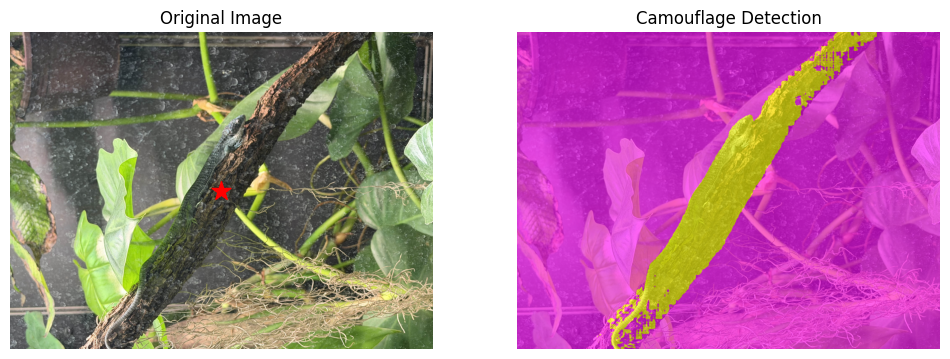

Processing uploaded image...


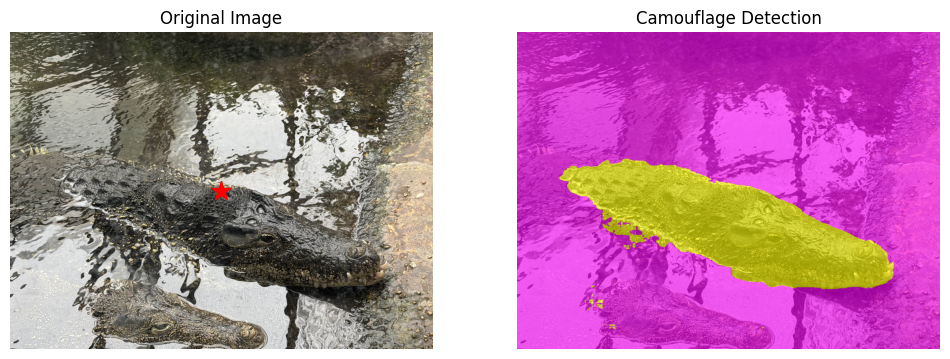

Processing uploaded image...


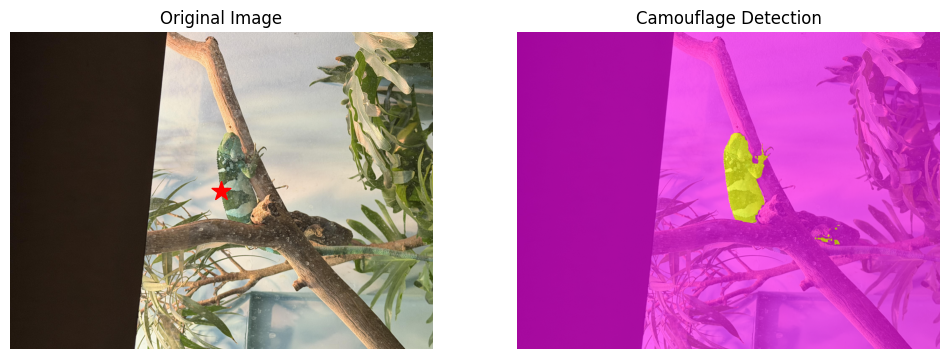

Processing uploaded image...


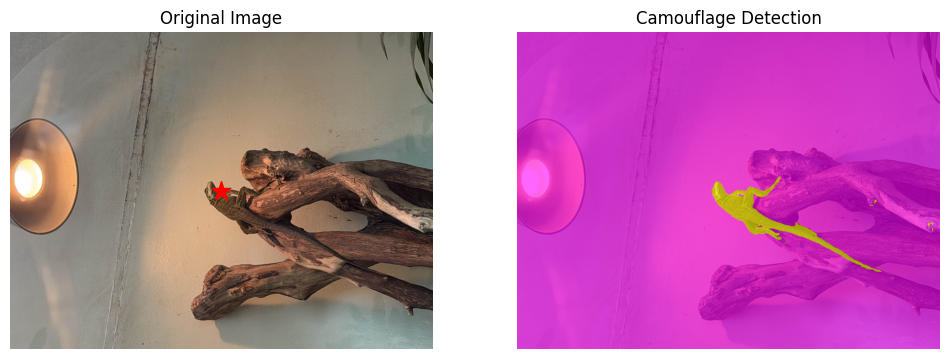

In [ ]:
# ==== STEP 8: INTERACTIVE DEMO ====
# Upload your own image to test the model!

import ipywidgets as widgets
from IPython.display import display
import io

def run_inference(b):
    if not uploader.value:
        print("Please upload an image first!")
        return

    # Get the uploaded image
    # Handle compatibility between ipywidgets versions (dict vs list)
    vals = uploader.value
    if isinstance(vals, dict):
        # Older ipywidgets: returns dict {filename: {metadata}}
        # We grab the first value in the dictionary
        uploaded_file = next(iter(vals.values()))
    else:
        # Newer ipywidgets: returns list/tuple [{metadata}]
        uploaded_file = vals[0]

    content = uploaded_file['content']

    # Convert to numpy
    image = Image.open(io.BytesIO(content)).convert("RGB")
    img_np = np.array(image)

    print(f"Processing uploaded image...")

    # Resize
    target_size = 1024
    img_resized = cv2.resize(img_np, (target_size, target_size))

    # Load Model (Ensure it's loaded)
    if 'spec_predictor' not in globals():
        spec_model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)
        spec_model.mask_decoder.load_state_dict(torch.load("camo_decoder_vith.pth"))
        spec_model.to(DEVICE)
        spec_model.eval()
        globals()['spec_predictor'] = SamPredictor(spec_model)

    predictor = globals()['spec_predictor']
    predictor.set_image(img_resized)

    # Automatic Prompting: Grid of points to find the object
    # Since we don't have a user click, we'll try a center point strategy
    h, w = img_resized.shape[:2]
    cx, cy = w // 2, h // 2

    masks, scores, _ = predictor.predict(
        point_coords=np.array([[cx, cy]]),
        point_labels=np.array([1]),
        multimask_output=False
    )

    # Resize back
    mask = cv2.resize(masks[0].astype(np.uint8), (img_np.shape[1], img_np.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Visualization
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.scatter([img_np.shape[1]//2], [img_np.shape[0]//2], c='red', marker='*', s=200, label='Center Prompt')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img_np)
    plt.imshow(mask, alpha=0.6, cmap='spring')
    plt.title("Camouflage Detection")
    plt.axis('off')
    plt.show()

# UI Components
uploader = widgets.FileUpload(
    accept='image/*',
    multiple=False
)

btn = widgets.Button(description="Detect Camouflage 🦎")
btn.on_click(run_inference)

print("Upload an image and click Detect:")
display(uploader, btn)

In [ ]:
# ==== STEP 7: GLOBAL QUANTITATIVE EVALUATION ====
# Calculate mIoU over the entire test set

def calculate_global_miou(model_type='base', max_samples=None):
    # Setup Predictor
    # CHANGED: Use 'vit_h' instead of 'vit_t'
    net = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)

    if model_type == 'specialized':
        # CHANGED: Load the correct vith weights file
        net.mask_decoder.load_state_dict(torch.load("camo_decoder_vith.pth"))

    net.to(DEVICE)
    net.eval()
    predictor = SamPredictor(net)

    test_pairs_full = get_image_mask_pairs(TEST_IMG_DIR, TEST_MASK_DIR, max_samples=max_samples)
    ious = []
    print(f"Calculating Global mIoU for {model_type} model on {len(test_pairs_full)} samples...")

    for idx, (img_path, mask_path) in enumerate(test_pairs_full):
        img = cv2.imread(img_path); img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        h_orig, w_orig = img.shape[:2]
        img_resized = cv2.resize(img, (TARGET_SIZE, TARGET_SIZE))
        mask_resized = cv2.resize(mask, (TARGET_SIZE, TARGET_SIZE), interpolation=cv2.INTER_NEAREST)

        # Get Prompt
        ys, xs = np.where(mask_resized > 128)
        if len(xs) == 0: continue
        cx, cy = int(np.mean(xs)), int(np.mean(ys))

        # Predict
        predictor.set_image(img_resized)
        masks, _, _ = predictor.predict(
            point_coords=np.array([[cx, cy]]),
            point_labels=np.array([1]),
            multimask_output=False
        )

        # Resize prediction back to original
        pred_resized = cv2.resize(masks[0].astype(np.uint8), (w_orig, h_orig), interpolation=cv2.INTER_NEAREST)

        # Metric
        pred_binary = pred_resized > 0.5
        gt_binary = mask > 128

        intersection = np.logical_and(pred_binary, gt_binary).sum()
        union = np.logical_or(pred_binary, gt_binary).sum()
        iou = intersection / union if union > 0 else 0.0
        ious.append(iou)

        if (idx+1) % 50 == 0: print(f"  Processed {idx+1}/{len(test_pairs_full)}")

    return np.mean(ious)

# Evaluate on subset first (faster), then full set if needed
base_miou = calculate_global_miou('base', max_samples=200)
spec_miou = calculate_global_miou('specialized', max_samples=200)

print(f"\nFinal Camouflage Results (200 samples):")
print(f"Base SAM ViT-H mIoU: {base_miou:.4f}")
print(f"Specialized SAM ViT-H mIoU: {spec_miou:.4f}")
print(f"Improvement: +{(spec_miou - base_miou)*100:.2f}%")

Found 4000 images in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/Image
Found 4000 masks in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/GT_Object
Matched 4000 image-mask pairs.
Calculating Global mIoU for base model on 200 samples...
  Processed 50/200
  Processed 100/200
  Processed 150/200
  Processed 200/200
Found 4000 images in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/Image
Found 4000 masks in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/GT_Object
Matched 4000 image-mask pairs.
Calculating Global mIoU for specialized model on 200 samples...
  Processed 50/200
  Processed 100/200
  Processed 150/200
  Processed 200/200

Final Camouflage Results (200 samples):
Base SAM ViT-H mIoU: 0.4752
Specialized SAM ViT-H mIoU: 0.6635
Improvement: +18.83%


In [ ]:
# Install Hugging Face Hub library
!pip install huggingface_hub

In [ ]:
import os
import zipfile
from tqdm import tqdm
from huggingface_hub import login, HfApi
from google.colab import userdata

# 1. Login
try:
    hf_token = userdata.get('HF_TOKEN')
    login(token=hf_token)
    print("✅ Logged in via Colab Secrets.")
except Exception as e:
    print("❌ Could not find 'HF_TOKEN'. Login interactively:")
    login()

# 2. Configuration
REPO_ID = "AAREKAZ/SpecialSAM"
FOLDER_TO_UPLOAD = "camo_embeddings_vith"
ZIP_FILE = "camo_embeddings_vith.zip"
METADATA_FILE = "camo_train_meta_vith.csv"
MODEL_FILE = "camo_decoder_vith.pth"

# 3. Helper Function for Zipping with Progress
def zip_folder_with_progress(folder_path, output_zip):
    print(f"Scanning files in {folder_path}...")
    files_to_zip = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            files_to_zip.append(os.path.join(root, file))

    print(f"Found {len(files_to_zip)} files to zip.")

    with zipfile.ZipFile(output_zip, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Use tqdm for progress bar
        for file in tqdm(files_to_zip, desc="Zipping", unit="file"):
            # Create relative path for archive
            arcname = os.path.relpath(file, os.path.dirname(folder_path))
            zipf.write(file, arcname)
    print(f"\n✅ Created {output_zip}")

# 4. Execution
api = HfApi()

print(f"Uploading to existing repo: {REPO_ID}...")

# ZIP and Upload Embeddings
if os.path.exists(FOLDER_TO_UPLOAD):
    if not os.path.exists(ZIP_FILE):
        print("Starting zip process...")
        zip_folder_with_progress(FOLDER_TO_UPLOAD, ZIP_FILE)
    else:
        print(f"Found existing zip file: {ZIP_FILE}. Skipping re-zip.")

    print(f"Uploading {ZIP_FILE} to Hugging Face...")
    try:
        api.upload_file(
            path_or_fileobj=ZIP_FILE,
            path_in_repo=ZIP_FILE,
            repo_id=REPO_ID,
            repo_type="model"
        )
    except Exception as e:
        print(f"Upload failed: {e}")

# Upload Metadata
if os.path.exists(METADATA_FILE):
    print("Uploading metadata CSV...")
    api.upload_file(
        path_or_fileobj=METADATA_FILE,
        path_in_repo=METADATA_FILE,
        repo_id=REPO_ID,
        repo_type="model"
    )

# Upload Trained Model
if os.path.exists(MODEL_FILE):
    print(f"Uploading trained model weights: {MODEL_FILE}...")
    api.upload_file(
        path_or_fileobj=MODEL_FILE,
        path_in_repo=MODEL_FILE,
        repo_id=REPO_ID,
        repo_type="model"
    )
else:
    print(f"⚠️ Model file '{MODEL_FILE}' not found. Make sure Step 5 (Training) has finished!")

print("✅ All Uploads Complete!")

✅ Logged in via Colab Secrets.
Uploading to existing repo: AAREKAZ/SpecialSAM...
Found existing zip file: camo_embeddings_vith.zip. Skipping re-zip.
Uploading camo_embeddings_vith.zip to Hugging Face...


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  camo_embeddings_vith.zip    :   0%|          | 25.2MB / 23.1GB            

No files have been modified since last commit. Skipping to prevent empty commit.


Uploading metadata CSV...
Uploading trained model weights: camo_decoder_vith.pth...


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  camo_decoder_vith.pth       :   3%|3         |  551kB / 16.3MB            

✅ All Uploads Complete!


# 🧠 How SAM Works & Why We Fine-Tuned It This Way

**Segment Anything Model (SAM)** consists of three independent components:

1.  **Image Encoder (Heavy 🐢):** A massive Vision Transformer (ViT) that analyzes the image and creates a rich "feature map" (embedding). It is computationally expensive but only needs to run **once per image**.
2.  **Prompt Encoder (Light 🐇):** Converts user inputs (clicks, boxes, text) into mathematical vectors. This is instant.
3.  **Mask Decoder (Light 🐇):** Takes the *Image Embedding* (from step 1) and *Prompt Vectors* (from step 2) to generate the final segmentation mask.

### 🛠️ Mapping Code to Concepts

*   **Step 4 (Pre-computation):** We ran the **Image Encoder** on all our training images and saved the embeddings to disk (`.npy` files). This allows us to skip the heavy calculation during training.
*   **Step 5 (Fine-Tuning):**
    *   `model.image_encoder.requires_grad = False`: We **froze** the image encoder. We assume it already "sees" the world well enough.
    *   `optimizer = ... (model.mask_decoder.parameters())`: We only updated the **Mask Decoder**. We taught it a specific new skill: *"When you see these features and this point, look for the hidden/camouflaged texture, not just the obvious object."*

This technique is called **Parameter-Efficient Fine-Tuning (PEFT)**. It allows us to customize a massive foundation model on a free Colab GPU in just minutes.